# Assignment module one - IPCV project 2025 #

0001181115 - Samuele Gasbarro - samuele.gasbarro@studio.unibo.it

0001177759 - Tommaso Bergonzoni - tommaso.bergonzoni@studio.unibo.it

0001191816 - Tommaso Bernardini - tommaso.bernardini6@studio.unibo.it

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./  #copy the content of a folder in the root of the Colab notebook
!unzip dataset.zip                                            # extract the content of the zipped folder

Mounted at /content/drive
Archive:  dataset.zip
   creating: dataset/
   creating: dataset/scenes/
  inflating: dataset/.DS_Store       
  inflating: __MACOSX/dataset/._.DS_Store  
   creating: dataset/models/
  inflating: dataset/scenes/scene_9.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_9.jpg  
  inflating: dataset/scenes/scene_8.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_8.jpg  
  inflating: dataset/scenes/scene_20.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_20.jpg  
  inflating: dataset/scenes/scene_21.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_21.jpg  
  inflating: dataset/scenes/scene_23.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_23.jpg  
  inflating: dataset/scenes/scene_22.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_22.jpg  
  inflating: dataset/scenes/scene_26.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_26.jpg  
  inflating: dataset/scenes/scene_27.jpg  
  inflating: __MACOSX/dataset/scenes/._scene_27.jpg  
  inflating: datas

### Useful library

---



In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In the first part we explore the basic operations of the object detection process using Computer Vision techniques, as seen in the lab session. We extend them to compute multiple istances on the of the same model on an instance.Then, we put together all the notions to realize the assignment

# Preprocessing

We decide to use GRAYSCALE images instead of RGB images for the following reasons:

*   Feature Detectors Like SIFT Work on Intensity Gradients
*   Reduces Dimensionality & Computation: grayscale has 1 channel vs 3 channels in RGB, so we have a faster process and less memory required




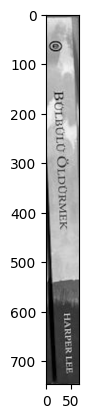

In [ ]:
img_model = cv2.imread('dataset/models/model_0.png', cv2.IMREAD_GRAYSCALE)
plt.imshow(img_model, cmap="gray", vmin=0, vmax=255)
plt.show()

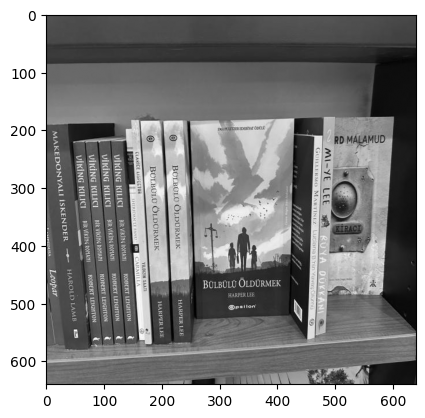

In [ ]:
img_scene = cv2.imread('dataset/scenes/scene_26.jpg', cv2.IMREAD_GRAYSCALE)
plt.imshow(img_scene, cmap="gray", vmin=0, vmax=255)
plt.show()

# Object Detection with Local Invariant Feature

**Pipeline**:
1. **Detection**: identify salient repeatable points, namely **keypoints**, in model and scene images;
2. **Description**: create a unique description of each point, usually based on its local pixel neighborhood;
3. **Matching**: match points from scene and model according to a similarity function between the descriptors;
4. **Position estimation**: estimate the position of the object in the scene image given enough matching points.

### Detect more instances of a model in a single scene





In [ ]:
# Checking if enough matches are found
MIN_MATCH_COUNT = 8

all_inliers = []
detected = 0

# Loop to find more occurrences
while len(good) > MIN_MATCH_COUNT:
    src_pts = np.float32([kp_model[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # Compute the homography with RANSAC
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    if M is not None:
        matches_mask = mask.ravel().tolist()

        # Gets the corners of the template image
        h, w = img_model.shape
        pts = np.float32([[0,0], [0,h-1], [w-1,h-1], [w-1,0]]).reshape(-1,1,2)

        # Project into scene
        dst = cv2.perspectiveTransform(pts, M)

        # Draw the box in the scene
        img_train_p = cv2.polylines(img_scene,[np.int32(dst)], True, 255, 3, cv2.LINE_AA)

        inliers = [m for i, m in enumerate(good) if matches_mask[i]]
        all_inliers.extend(inliers)

        # Remove used matches (inliers) to search for new matches
        good = [m for i, m in enumerate(good) if not matches_mask[i]]

        detected += 1
    else:
        break


Objects detected: 2


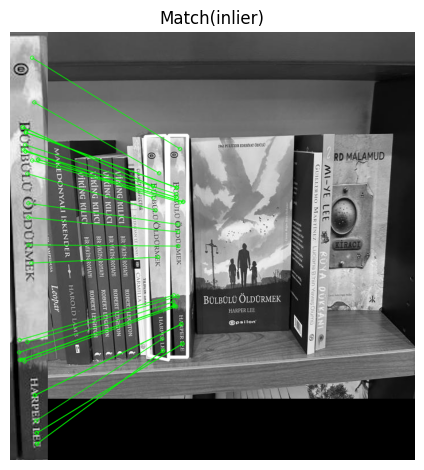

In [ ]:
print(f"Objects detected: {detected}")

# Draw valid matches
draw_params = dict(
    matchColor=(0, 255, 0),      # green
    singlePointColor=None,
    matchesMask=None,
    flags=2
)

img_matches = cv2.drawMatches(img_model, kp_model, img_scene, kp_scene, all_inliers, None, **draw_params)

# Show results
plt.title("Match(inlier)")
plt.imshow(img_matches)
plt.axis('off')


plt.tight_layout()
plt.show()

# Detecting the full Dataset

In [ ]:
import os

In [ ]:
# Counting the number of images to create the nested loop
folder_path_models = 'dataset/models'
image_count_models = sum(
    1 for filename in os.listdir(folder_path_models)
    if filename.lower().endswith('.png')
)

folder_path_scenes = 'dataset/scenes'
image_count_scenes = sum(
    1 for filename in os.listdir(folder_path_scenes)
    if filename.lower().endswith('.jpg')
)

We also tried to use some linear/non-linear filter to preprocess images in order to have better results, but it seems to doesn't work

In [ ]:
# Saving the images from the dataset
img_models = []
for i in range(image_count_models):
    img_model = cv2.imread(f'dataset/models/model_{i}.png', cv2.IMREAD_GRAYSCALE)
    img_models.append(img_model)


img_scenes_gray = []
img_scenes_color = []
for i in range(image_count_scenes):
    img_gray = cv2.imread(f'dataset/scenes/scene_{i}.jpg', cv2.IMREAD_GRAYSCALE) # Grayscale version for the keypoints
    img_color = cv2.imread(f'dataset/scenes/scene_{i}.jpg', cv2.IMREAD_COLOR) # Color version for the final output

    img_scenes_gray.append(img_gray)
    img_scenes_color.append(img_color)

## For each scene, identify all objects

#### Useful functions

In [ ]:
def angle_between_vectors(v1, v2):
    """Compute the angle in degrees between two vectors."""
    unit_v1 = v1 / np.linalg.norm(v1)
    unit_v2 = v2 / np.linalg.norm(v2)
    dot_product = np.clip(np.dot(unit_v1, unit_v2), -1.0, 1.0)
    angle = np.arccos(dot_product)
    return np.degrees(angle)

def is_quadrilateral_rectangular_like(quad, angle_tolerance=30, min_valid_angles=3):
    """
    Checks if a quadrilateral is roughly rectangular or parallelogram-like.

    Parameters:
        quad (np.array): Array of shape (4, 2) or (4, 1, 2).
        angle_tolerance (float): Degrees of tolerance around 90° for each corner.
        min_valid_angles (int): Minimum number of corners that must be valid.

    Returns:
        bool: True if shape is accepted as a valid book candidate.
    """
    quad = quad.reshape(4, 2)
    valid_count = 0

    for i in range(4):
        p1 = quad[i]
        p2 = quad[(i + 1) % 4]
        p0 = quad[(i - 1) % 4]

        v1 = p0 - p1
        v2 = p2 - p1

        angle = angle_between_vectors(v1, v2)

        if 90 - angle_tolerance <= angle <= 90 + angle_tolerance:
            valid_count += 1

    return valid_count >= min_valid_angles

###  Version 1: inliers

"**detect_and_localize**" is the function that incorporates the object detection process. This are the main steps:

- Feature extraction (keypoints and descriptors):
Uses SIFT to detect and describe keypoints in both the model and the scene images.

- Descriptor matching:
Uses FLANN (Fast Library for Approximate Nearest Neighbors) to match descriptors between model and scene.
For each model descriptor, it finds the two nearest matches in the scene.

- Lowe’s Ratio Test:
Filters matches by keeping only those where the first match is significantly better than the second one (m.distance < 0.8 * n.distance).
This helps reduce false positives.

- Detection of multiple homographies:
while there are at least MIN_MATCH_COUNT good matches:

  - Builds a homography matrix using RANSAC, which estimates how the model points map to the scene points.

  - If the homography is valid:

      - Calculates the four transformed corners of the model → bounding box in the scene

      - Computes the area of the box

      - Discards detections that are too small or too large (likely noise or errors)

      - Displays the inliers (matches consistent with the homography)

      - Removes the inliers used and continues the loop to detect additional instances.

Output:

A list of dictionaries, each containing:

- coords: coordinates of the bounding box (four corners)

- area: area of the box in pixels


The main difficult of the assignment was to find the potentially best values for the parameters, this because:
- Too lenient parameters → more false positives

- Too strict parameters → may miss real objects

After a very huge number of tests we decided that the following configuratoion guarantees us a good threshold of missed and founded books

| Parameter                       | Effect                                                                                                                                  |
| ------------------------------- | --------------------------------------------------------------------------------------------------------------------------------------- |
| `contrastThreshold=0.04` (SIFT) | Lowers the threshold → detects more keypoints, even with low contrast. Useful for weakly textured objects but may introduce more noise. |
| `edgeThreshold=15` (SIFT)       | Higher values → fewer keypoints near edges. More robust to non-informative edges, but may lose fine details.                            |
| `sigma=1.2` (SIFT)              | Controls initial scale smoothing. Higher values → less noise, but fewer fine details.                                                   |
| `trees=10` (FLANN)              | Increases the complexity of the KDTree index. More accurate matches, but slower.                                                        |
| `checks=100` (FLANN)            | More comparisons per match → higher accuracy, but slower performance.                                                                   |
| `0.8` in Lowe’s test            | Higher threshold → less filtering → more matches, but higher risk of false positives.                                                   |
| `MIN_MATCH_COUNT=12`            | Minimum threshold to accept a detection. Too high → risk of missing real objects; too low → more false positives.                       |
| `area ∈ [7000, 64000]`          | Filters out boxes that are too small or too large — likely noise or errors. Crucial to prevent false detections.                        |
| `cv2.RANSAC, 2.0`               | Tolerance for transformation error. Lower = more selective, but may discard valid noisy detections.                                     |



In [ ]:
def detect_and_localize(img_model, img_scene, model_idx, color=(0, 255, 0), MIN_MATCH_COUNT=12): # 12
    # Initiate SIFT detector
    sift = cv2.SIFT_create(
        contrastThreshold=0.04,
        edgeThreshold=10,
        sigma=1.2
    )

    # find the keypoints and descriptors with SIFT
    kp_model = sift.detect(img_model)
    kp_scene = sift.detect(img_scene)

    # Describing keypoints for model and scene images
    kp_model, des_model = sift.compute(img_model, kp_model)
    kp_scene, des_scene = sift.compute(img_scene, kp_scene)

    # Defining index for approximate kdtree algorithm
    FLANN_INDEX_KDTREE = 1

    # Defining parameters for algorithm
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=10)

    # Defining search params
    search_params = dict(checks=100)

    # Initializing matcher
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    # Matching and finding the 2 closest elements for each model descriptor
    matches = flann.knnMatch(des_model, des_scene, k=2)

    # Filtering false matches applying Lowe's ratio test
    good = []
    for m, n in matches:
        if m.distance < 0.8 * n.distance: # 0.7
            good.append(m)

    detected_instances = []

    # Loop to detect multiple instances of the model in the scene
    while len(good) > MIN_MATCH_COUNT:
        # Building the correspondence arrays of good matches
        src_pts = np.float32([kp_model[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

        # Using RANSAC to estimate a robust homography: it returns the homography M and a mask for the discarded points.
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 2.0)  # 2.0

        # Checking if the homography can be found
        if M is not None:
            # Mask of discarded point used in visualization
            matches_mask = mask.ravel().tolist()

            # Creates the rectangular outline of the model and transforms it into the scene via M
            # Corners of the model image
            h, w = img_model.shape[:2]
            pts = np.float32([[0,0], [w-1,0], [w-1,h-1], [0,h-1]]).reshape(-1,1,2)
            # Projecting the corners into the scene image
            dst = cv2.perspectiveTransform(pts, M)

            # Calculate the area of ​​the bounding box using the polygon formula (determinant)
            box_coords = [tuple(pt[0]) for pt in dst]

            pts_array = np.array(box_coords)
            area = 0.5 * np.abs(np.dot(pts_array[:, 0], np.roll(pts_array[:, 1], 1)) -
                                np.dot(pts_array[:, 1], np.roll(pts_array[:, 0], 1)))

            # Extracts good matches (inliers)
            inliers = [m for i, m in enumerate(good) if matches_mask[i]]

            # Filter out unreliable results
            if len(inliers) < 10:
                break

            # Putting a limit on the dimension of the area to avoid no-sense boxes
            if 7000 <= area <= 64000:
              if is_quadrilateral_rectangular_like(dst, angle_tolerance=30, min_valid_angles=3):
                # Saving the coordinates of the homography and the value of the area
                detected_instances.append({
                    'coords': box_coords,
                    'area': int(area)
                })

            # Showing inliers of the instance founded on the scene
            scene_with_inliers = cv2.cvtColor(img_scene, cv2.COLOR_GRAY2BGR)
            for m in inliers:
                pt = tuple(np.int32(kp_scene[m.trainIdx].pt))
                cv2.circle(scene_with_inliers, pt, radius=4, color=color, thickness=-1)

            plt.imshow(cv2.cvtColor(scene_with_inliers, cv2.COLOR_BGR2RGB))
            plt.title(f"Counting Inliers for Model_{model_idx}")
            plt.axis('off')
            plt.show()
            print(f"Number of inliers = {len(inliers)}")

            # Removing the inliers found by good, so in the next while loop we can search for a new instance of the model in the same scene, without confusing the matches already used
            good = [m for i, m in enumerate(good) if not matches_mask[i]]
        else:
            break

    # Returns the detected instances
    return detected_instances


In this section, we prepare the results display. For each scene image, we check whether each model image is identified; if so, we print the coordinates for each instance.

In [ ]:
colors = [
    (255, 0, 0),   # blue
    (0, 255, 0),   # green
    (0, 0, 255)    # red
]

# Loop for the images
for scene_idx, (img_scene_gray, img_scene_color) in enumerate(zip(img_scenes_gray, img_scenes_color)):
    print(f"\n--- Scene {scene_idx} ---")
    scene_with_boxes = img_scene_color.copy()
    scene_mask_total = np.zeros_like(img_scene_gray, dtype=np.uint8)

    descriptions = []

    # Looping all models for each image
    for model_idx, img_model in enumerate(img_models):
        color = colors[model_idx % len(colors)] # Each book has its own color for the bounding boxes
        #detected_instances = detect_and_localize(img_model, img_scene_gray, model_idx, color=color) # We pass to the function the gray images
        detected_instances, scene_mask_total = detect_and_localize(
            img_model, img_scene_gray, model_idx, color=color,
            scene_mask_total=scene_mask_total  # <--- passa e aggiorna la maschera
        )

        if detected_instances:
            # Generating the output
            desc = f"Book {model_idx} - {len(detected_instances)} instance(s) found:"
            for i, inst in enumerate(detected_instances, 1):
                tl, tr, br, bl = inst['coords']
                area = inst['area']
                desc += f"\n  Instance {i} {{top_left: {tuple(map(int, tl))}, " \
                        f"top_right: {tuple(map(int, tr))}, " \
                        f"bottom_left: {tuple(map(int, bl))}, " \
                        f"bottom_right: {tuple(map(int, br))}, " \
                        f"area: {area}px}}"


                # Drawing the bounding box
                cv2.polylines(scene_with_boxes, [np.int32(inst['coords'])], True, color, 3, cv2.LINE_AA)

            descriptions.append(desc)

    # Showing the scene in coloured version with the draw of the bounding boxes
    plt.figure(figsize=(10, 8))
    plt.title(f"Bounding Boxes - Scene {scene_idx}")
    plt.imshow(cv2.cvtColor(scene_with_boxes, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    # Printing the textual output
    for desc in descriptions:
        print(desc)


The output cells have been cleared in order to reduce the file size

### Version 2: mask

The version that uses inliers is effective, but not sufficiently so. Both in terms of results, as some instances are missed, and in terms of finding the ideal hyperparameters for generalization. We therefore sought an alternative method to implement the task:

Without distorting what has already been done previously, we have introduced the use of masks, in order to progressively hide the instances already found and allow for a "simpler" search.

In [ ]:
def detect_and_localize_with_mask(img_model, img_scene_init, model_idx, color=(0, 255, 0), MIN_MATCH_COUNT=12):
    img_scene = img_scene_init.copy()
    detected_instances = []
    sift = cv2.SIFT_create(contrastThreshold=0.04, edgeThreshold=10, sigma=1.2)

    kp_model, des_model = sift.detectAndCompute(img_model, None)
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=10)
    search_params = dict(checks=100)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    mask_scene = np.ones_like(img_scene, dtype=np.uint8) * 255

    while True:
        kp_scene, des_scene = sift.detectAndCompute(img_scene, None)
        if des_scene is None or len(des_scene) < 2:
            break

        matches = flann.knnMatch(des_model, des_scene, k=2)
        good = [m for m, n in matches if m.distance < 0.8 * n.distance]

        if len(good) < MIN_MATCH_COUNT:
            break

        src_pts = np.float32([kp_model[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 2.0)
        if M is None:
            break

        h, w = img_model.shape[:2]
        corners_model = np.float32([[0, 0], [w - 1, 0], [w - 1, h - 1], [0, h - 1]]).reshape(-1, 1, 2)
        projected_corners = cv2.perspectiveTransform(corners_model, M)

        area = cv2.contourArea(projected_corners)
        if not (7000 <= area <= 64000):
            break

        if not is_quadrilateral_rectangular_like(projected_corners):
            break

        box_coords = [tuple(pt[0]) for pt in projected_corners]
        detected_instances.append({
            'coords': box_coords,
            'area': int(area)
        })

        # Create perspective mask to remove the found area
        white_mask = np.ones((h, w), dtype=np.uint8) * 255
        mask_proj = cv2.warpPerspective(white_mask, M, (img_scene.shape[1], img_scene.shape[0]))
        mask_scene = cv2.bitwise_and(mask_scene, cv2.bitwise_not(mask_proj))
        img_scene = cv2.bitwise_and(img_scene_init, img_scene_init, mask=mask_scene)

    return detected_instances


Full cycle


--- Scene 0 ---


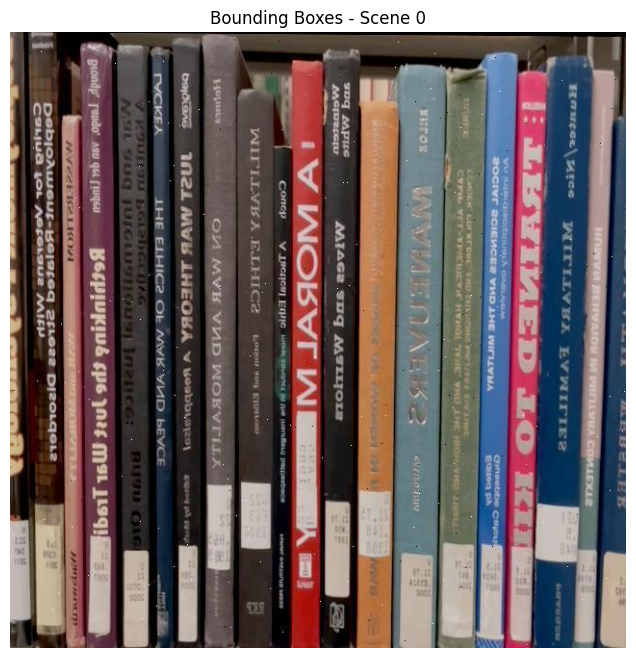


--- Scene 1 ---


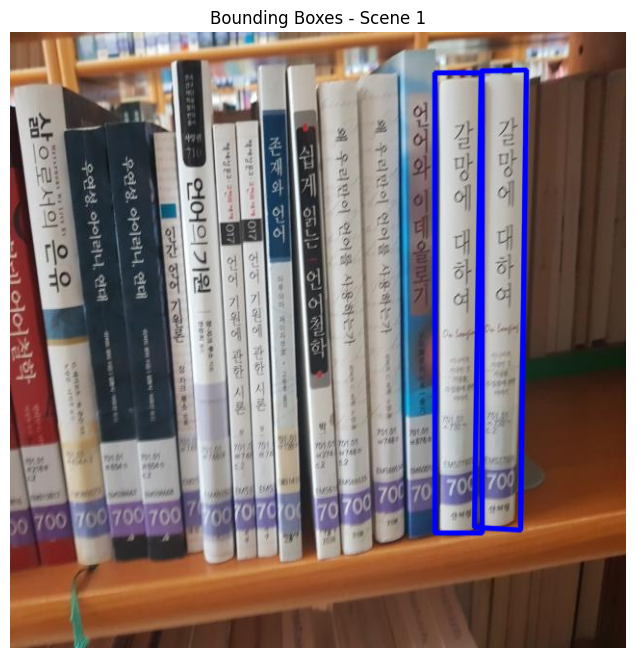

Book 18 - 2 instance(s) found:
  Instance 1 {top_left: (441, 42), top_right: (490, 42), bottom_left: (441, 520), bottom_right: (490, 520), area: 23297px}
  Instance 2 {top_left: (489, 40), top_right: (536, 39), bottom_left: (482, 514), bottom_right: (530, 517), area: 22673px}

--- Scene 2 ---


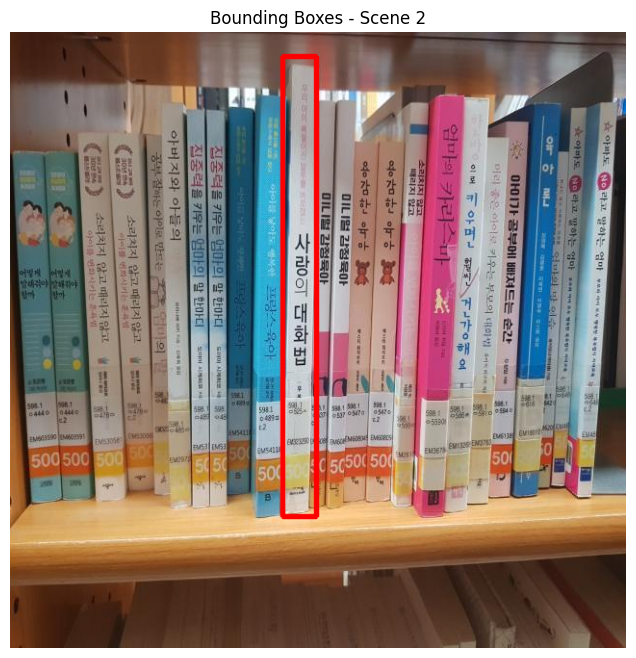

Book 17 - 1 instance(s) found:
  Instance 1 {top_left: (283, 25), top_right: (318, 25), bottom_left: (283, 503), bottom_right: (318, 503), area: 16334px}

--- Scene 3 ---


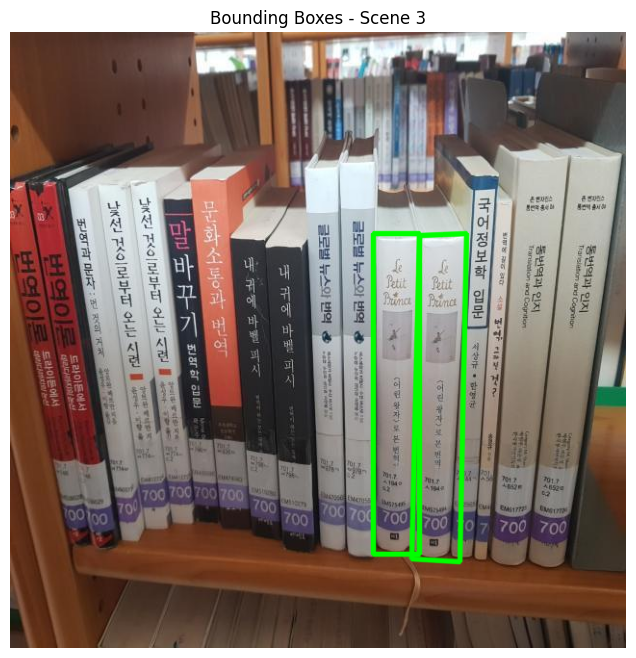

Book 16 - 2 instance(s) found:
  Instance 1 {top_left: (377, 209), top_right: (425, 209), bottom_left: (377, 542), bottom_right: (425, 542), area: 16106px}
  Instance 2 {top_left: (425, 211), top_right: (474, 209), bottom_left: (417, 547), bottom_right: (467, 550), area: 16692px}

--- Scene 4 ---


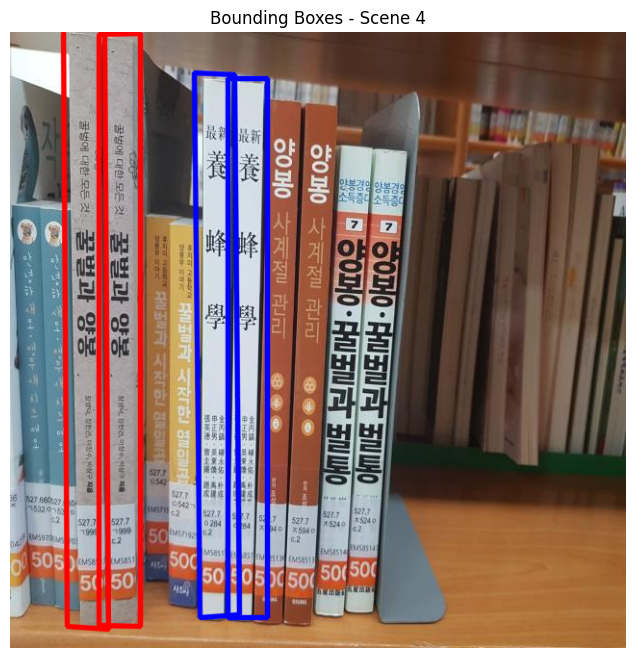

Book 14 - 2 instance(s) found:
  Instance 1 {top_left: (92, 2), top_right: (135, 1), bottom_left: (92, 616), bottom_right: (135, 617), area: 26501px}
  Instance 2 {top_left: (55, -3), top_right: (98, -3), bottom_left: (59, 617), bottom_right: (102, 620), area: 26617px}
Book 15 - 2 instance(s) found:
  Instance 1 {top_left: (226, 48), top_right: (267, 48), bottom_left: (226, 608), bottom_right: (267, 608), area: 22966px}
  Instance 2 {top_left: (191, 42), top_right: (233, 44), bottom_left: (197, 608), bottom_right: (238, 605), area: 23446px}

--- Scene 5 ---


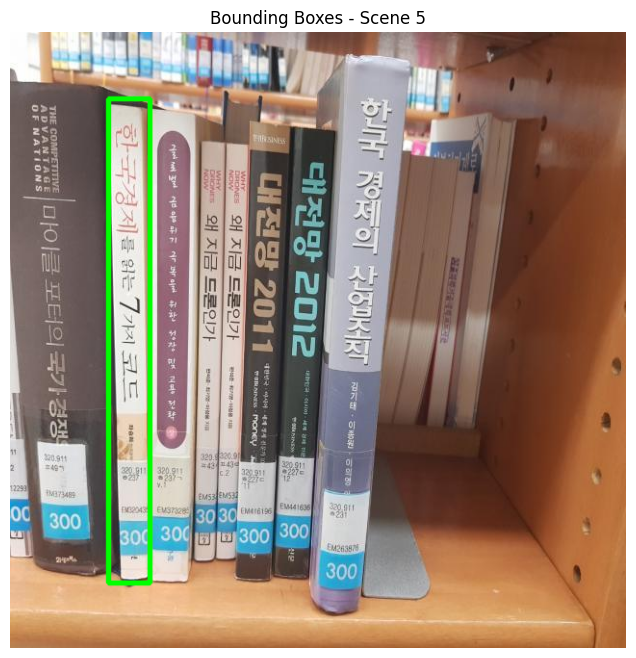

Book 13 - 1 instance(s) found:
  Instance 1 {top_left: (102, 69), top_right: (145, 69), bottom_left: (102, 572), bottom_right: (145, 572), area: 21700px}

--- Scene 6 ---


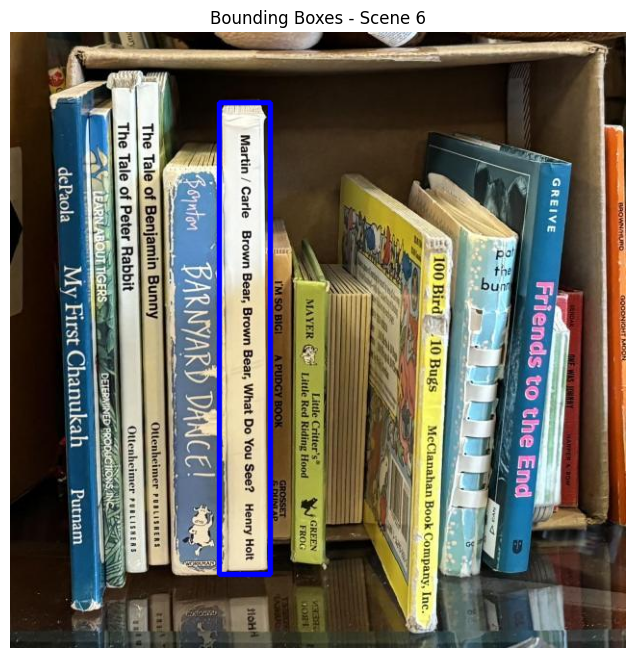

Book 21 - 1 instance(s) found:
  Instance 1 {top_left: (217, 73), top_right: (270, 73), bottom_left: (217, 563), bottom_right: (270, 563), area: 26217px}

--- Scene 7 ---


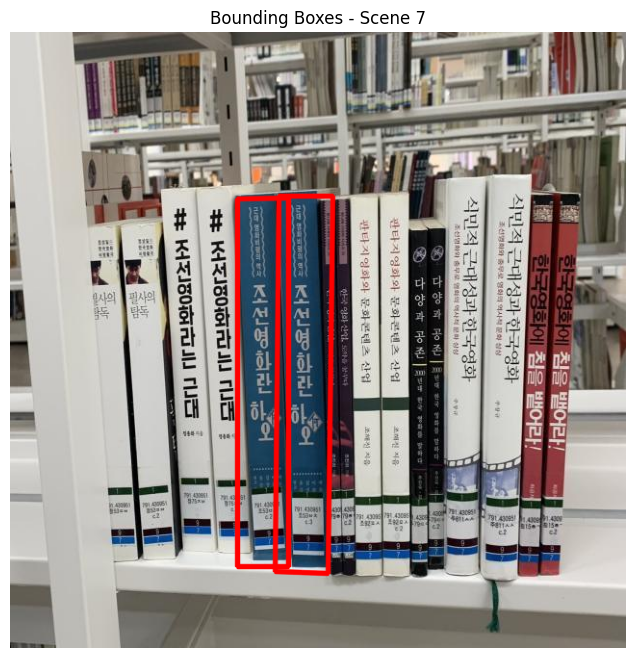

Book 20 - 2 instance(s) found:
  Instance 1 {top_left: (236, 173), top_right: (289, 172), bottom_left: (236, 555), bottom_right: (289, 555), area: 20431px}
  Instance 2 {top_left: (279, 170), top_right: (335, 170), bottom_left: (275, 560), bottom_right: (330, 562), area: 21672px}

--- Scene 8 ---


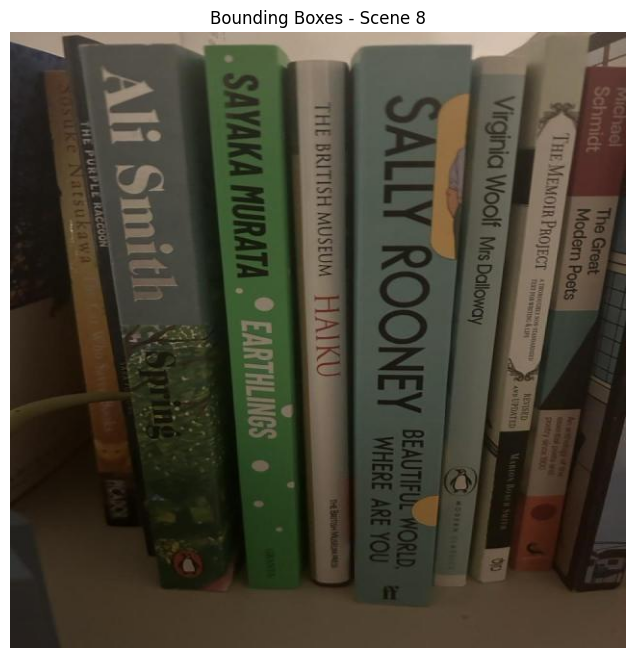


--- Scene 9 ---


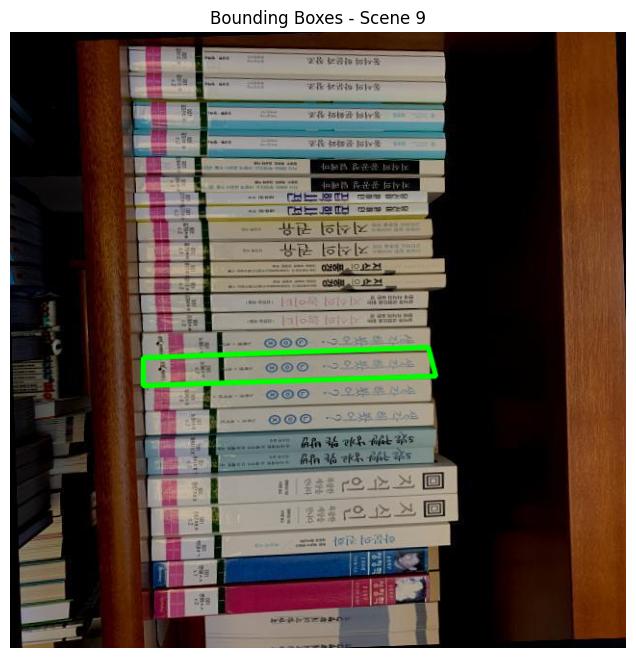

Book 19 - 1 instance(s) found:
  Instance 1 {top_left: (434, 327), top_right: (442, 357), bottom_left: (138, 338), bottom_right: (138, 367), area: 8924px}

--- Scene 10 ---


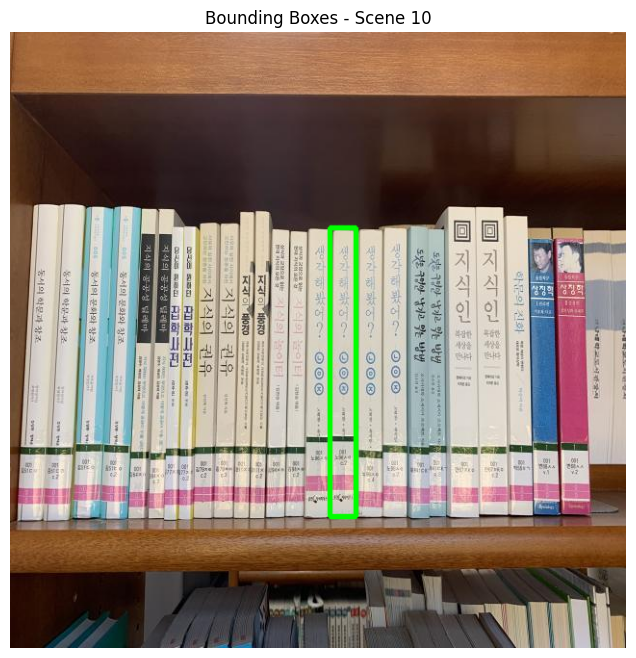

Book 19 - 1 instance(s) found:
  Instance 1 {top_left: (332, 203), top_right: (359, 203), bottom_left: (332, 503), bottom_right: (359, 503), area: 8265px}

--- Scene 11 ---


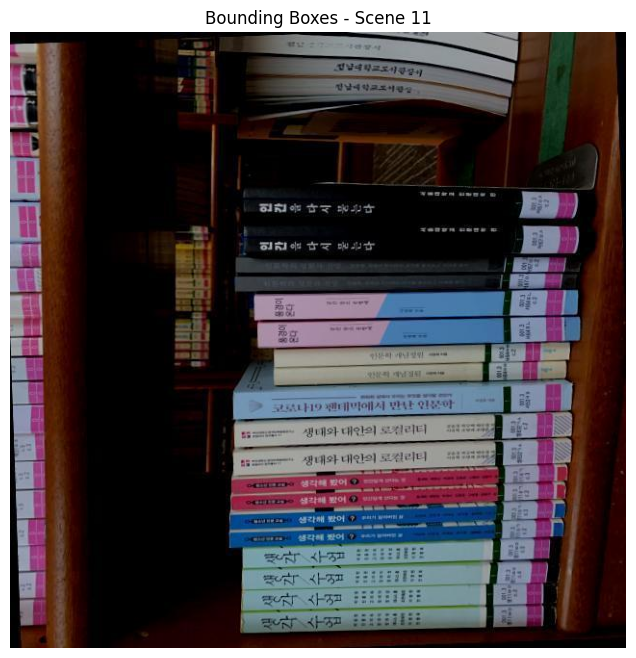


--- Scene 12 ---


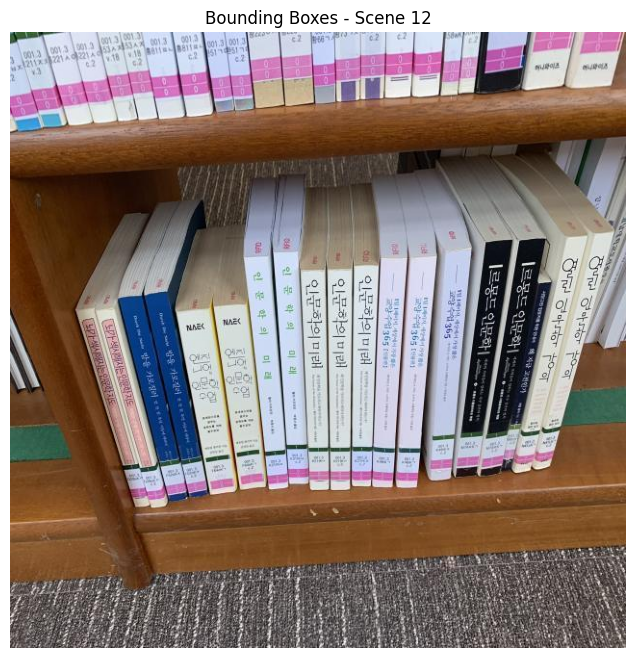


--- Scene 13 ---


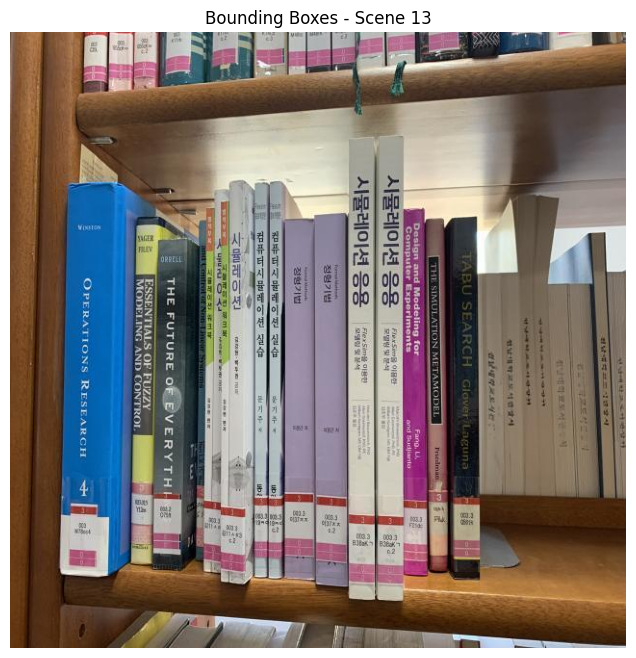


--- Scene 14 ---


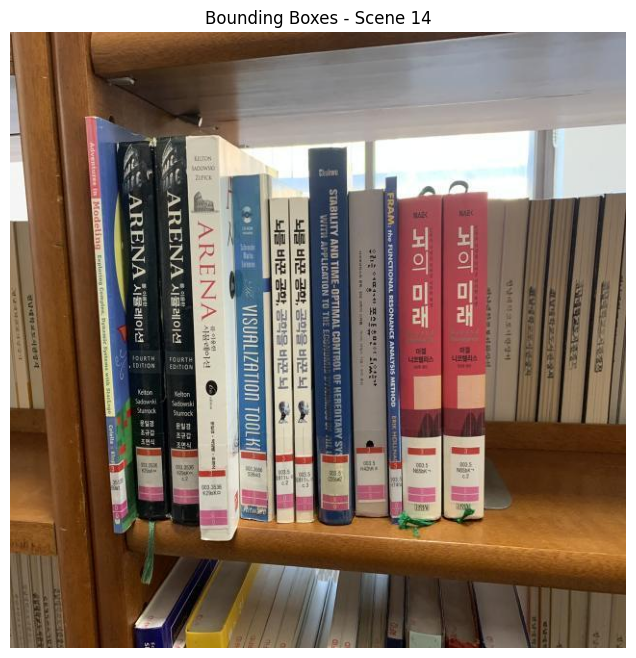


--- Scene 15 ---


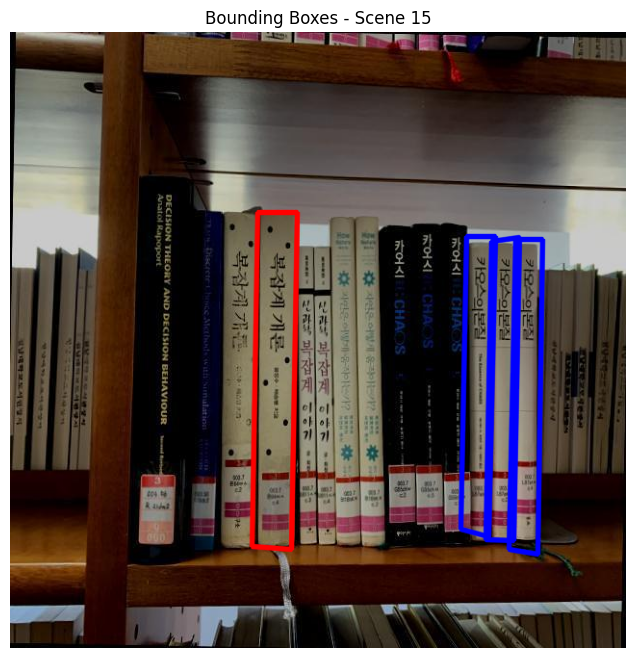

Book 11 - 1 instance(s) found:
  Instance 1 {top_left: (257, 187), top_right: (298, 187), bottom_left: (251, 534), bottom_right: (292, 537), area: 14530px}
Book 12 - 3 instance(s) found:
  Instance 1 {top_left: (500, 217), top_right: (529, 213), bottom_left: (494, 527), bottom_right: (523, 528), area: 9095px}
  Instance 2 {top_left: (474, 212), top_right: (504, 212), bottom_left: (468, 516), bottom_right: (497, 524), area: 9224px}
  Instance 3 {top_left: (525, 215), top_right: (553, 215), bottom_left: (518, 537), bottom_right: (548, 542), area: 9441px}

--- Scene 16 ---


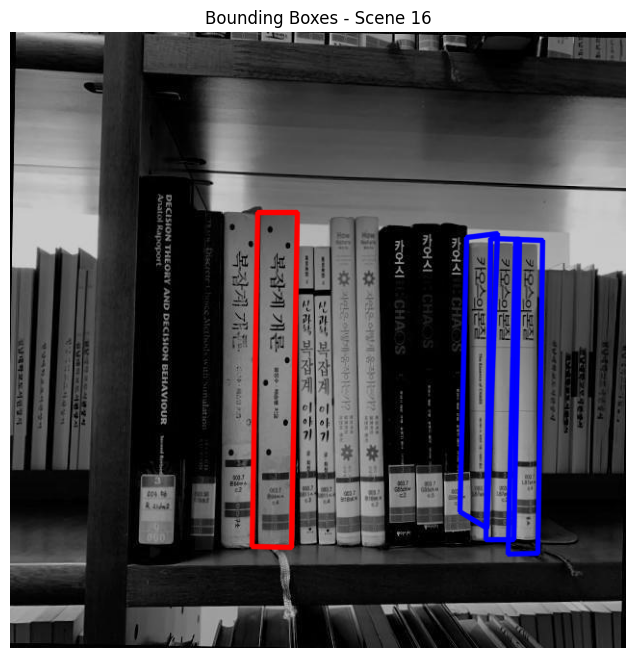

Book 11 - 1 instance(s) found:
  Instance 1 {top_left: (257, 187), top_right: (298, 187), bottom_left: (251, 534), bottom_right: (292, 535), area: 14475px}
Book 12 - 3 instance(s) found:
  Instance 1 {top_left: (499, 214), top_right: (529, 215), bottom_left: (494, 527), bottom_right: (523, 527), area: 9240px}
  Instance 2 {top_left: (474, 213), top_right: (506, 209), bottom_left: (467, 498), bottom_right: (495, 515), area: 8915px}
  Instance 3 {top_left: (525, 215), top_right: (553, 216), bottom_left: (517, 542), bottom_right: (548, 541), area: 9681px}

--- Scene 17 ---


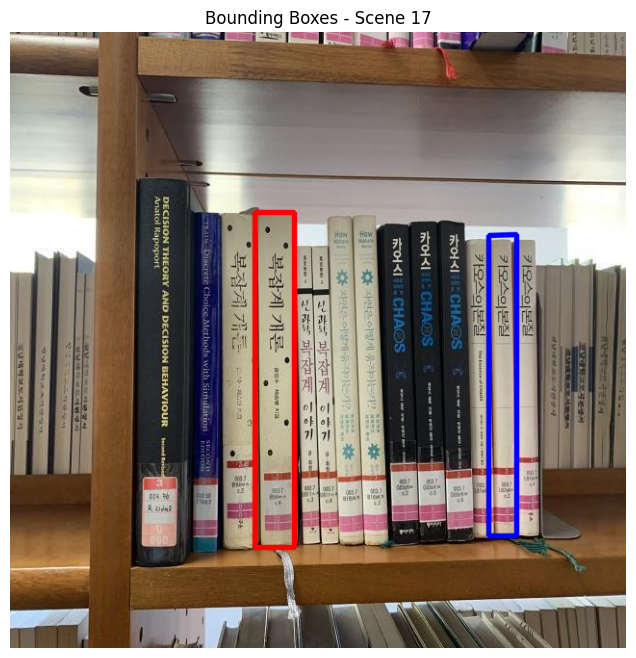

Book 11 - 1 instance(s) found:
  Instance 1 {top_left: (254, 187), top_right: (295, 187), bottom_left: (254, 535), bottom_right: (295, 535), area: 14277px}
Book 12 - 1 instance(s) found:
  Instance 1 {top_left: (497, 211), top_right: (526, 210), bottom_left: (497, 523), bottom_right: (526, 523), area: 9090px}

--- Scene 18 ---


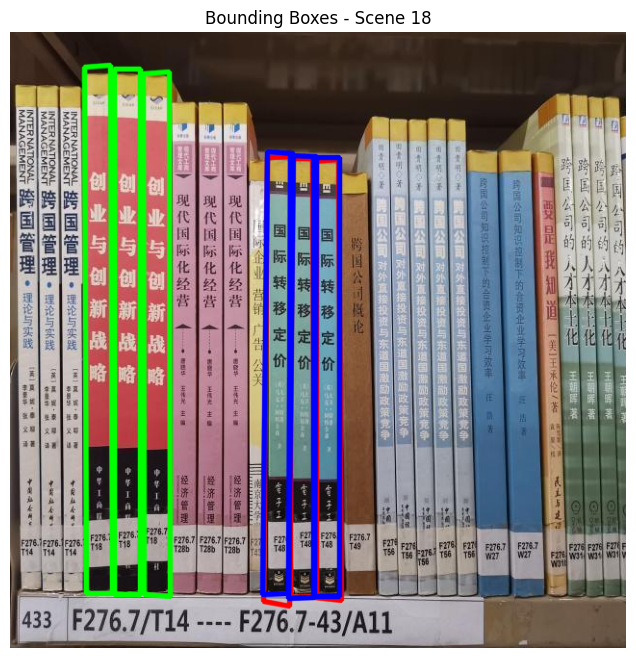

Book 8 - 3 instance(s) found:
  Instance 1 {top_left: (291, 131), top_right: (318, 131), bottom_left: (291, 587), bottom_right: (318, 586), area: 12327px}
  Instance 2 {top_left: (314, 134), top_right: (341, 132), bottom_left: (316, 587), bottom_right: (344, 590), area: 12604px}
  Instance 3 {top_left: (267, 130), top_right: (293, 129), bottom_left: (263, 591), bottom_right: (290, 596), area: 12289px}
Book 9 - 3 instance(s) found:
  Instance 1 {top_left: (315, 130), top_right: (342, 130), bottom_left: (315, 586), bottom_right: (342, 586), area: 12344px}
  Instance 2 {top_left: (291, 128), top_right: (318, 129), bottom_left: (289, 588), bottom_right: (316, 587), area: 12410px}
  Instance 3 {top_left: (267, 124), top_right: (294, 126), bottom_left: (262, 584), bottom_right: (289, 583), area: 12377px}
Book 10 - 3 instance(s) found:
  Instance 1 {top_left: (108, 38), top_right: (135, 38), bottom_left: (108, 584), bottom_right: (135, 584), area: 14743px}
  Instance 2 {top_left: (77, 36), to

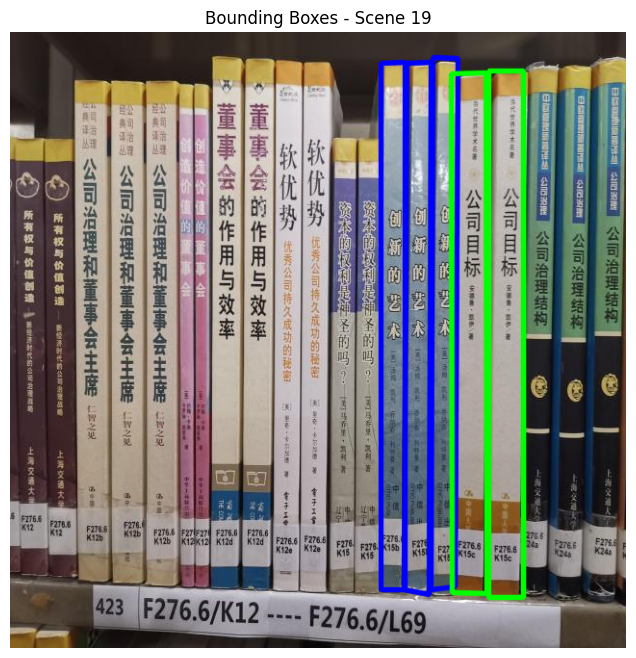

Book 6 - 3 instance(s) found:
  Instance 1 {top_left: (385, 32), top_right: (410, 31), bottom_left: (385, 579), bottom_right: (410, 579), area: 14196px}
  Instance 2 {top_left: (439, 26), top_right: (465, 27), bottom_left: (437, 579), bottom_right: (462, 576), area: 14114px}
  Instance 3 {top_left: (412, 32), top_right: (437, 31), bottom_left: (409, 579), bottom_right: (435, 584), area: 14160px}
Book 7 - 2 instance(s) found:
  Instance 1 {top_left: (497, 40), top_right: (533, 40), bottom_left: (497, 587), bottom_right: (533, 587), area: 19902px}
  Instance 2 {top_left: (458, 43), top_right: (494, 42), bottom_left: (459, 582), bottom_right: (495, 583), area: 19312px}

--- Scene 20 ---


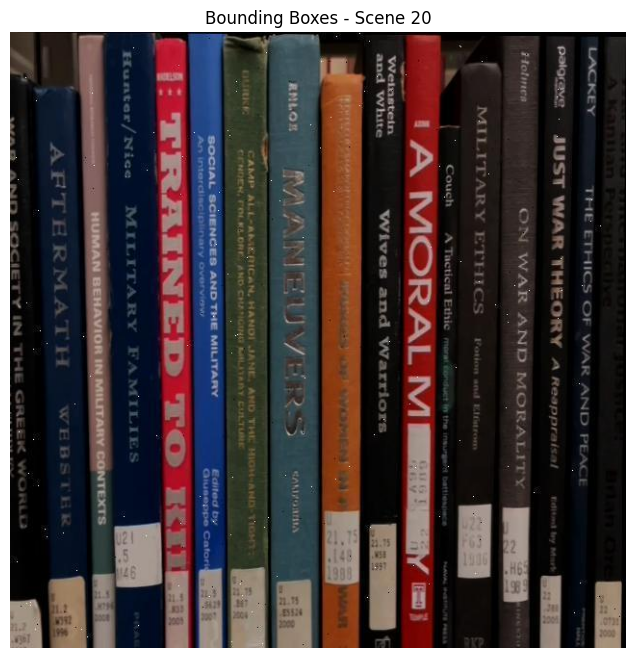


--- Scene 21 ---


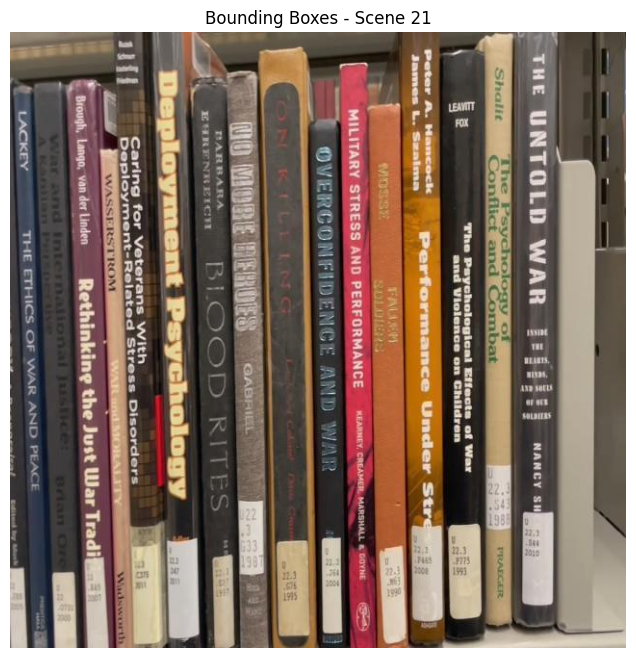


--- Scene 22 ---


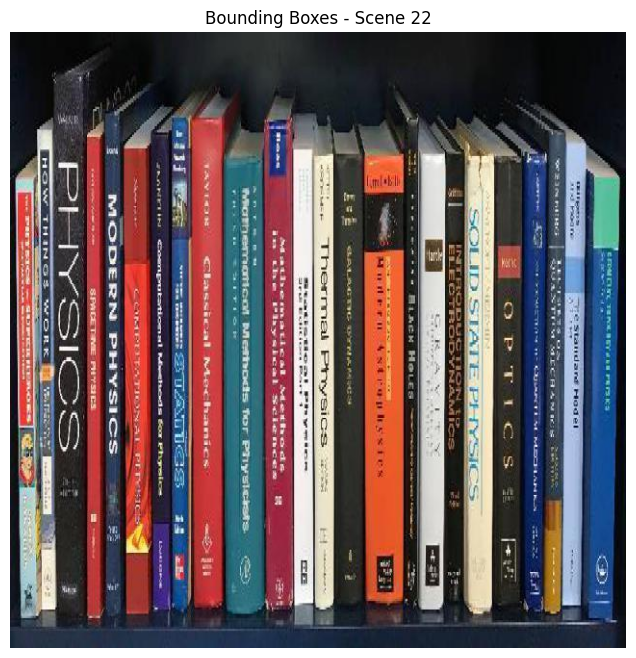


--- Scene 23 ---


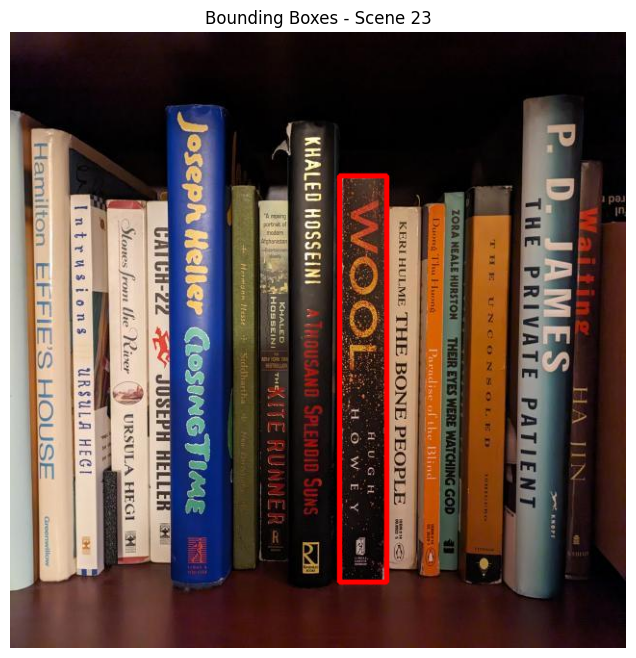

Book 5 - 1 instance(s) found:
  Instance 1 {top_left: (342, 149), top_right: (391, 149), bottom_left: (342, 571), bottom_right: (391, 571), area: 20606px}

--- Scene 24 ---


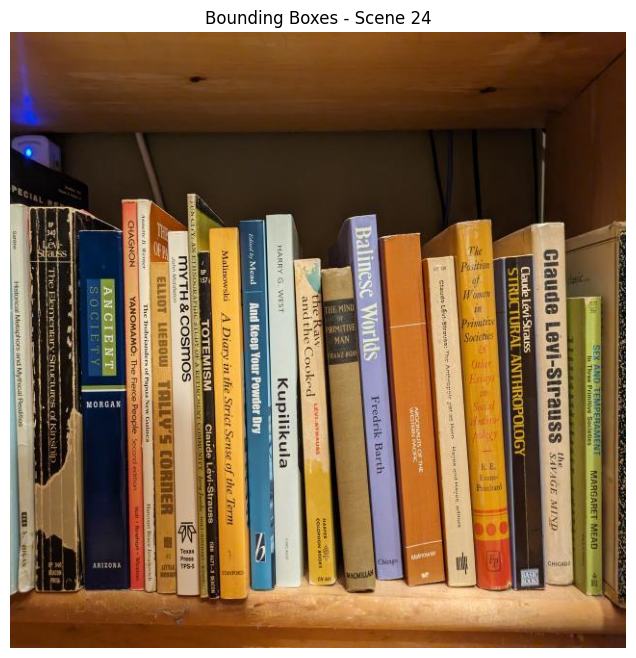


--- Scene 25 ---


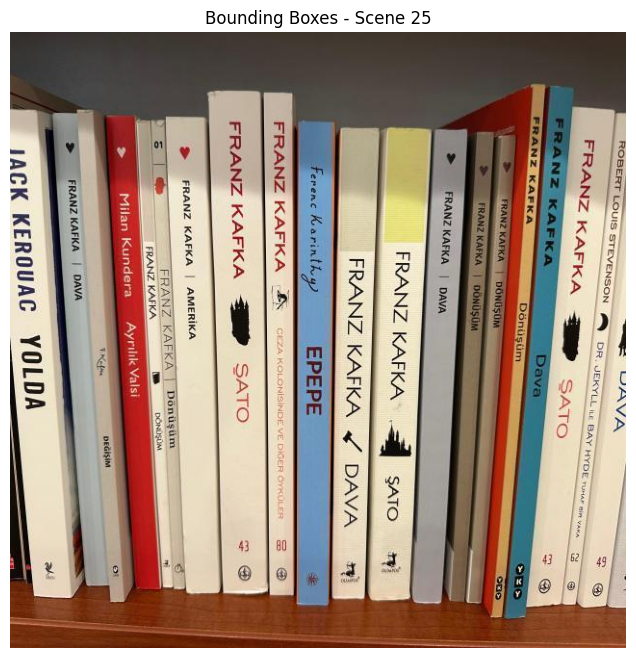


--- Scene 26 ---


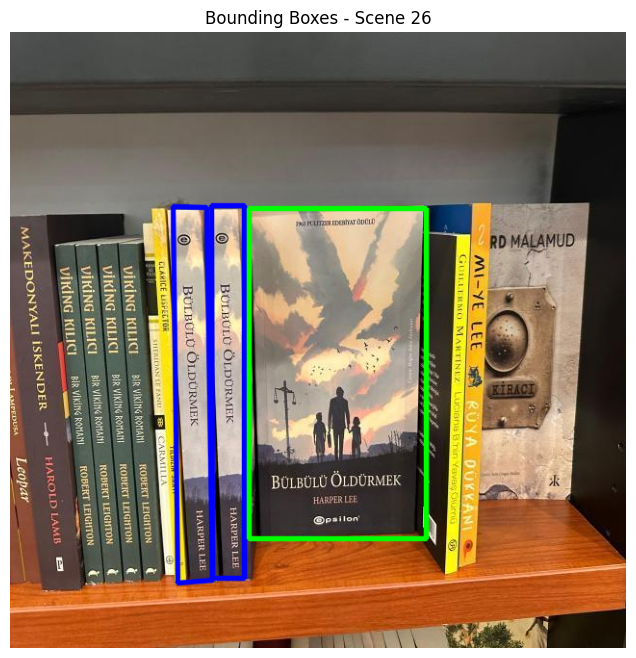

Book 0 - 2 instance(s) found:
  Instance 1 {top_left: (209, 180), top_right: (243, 180), bottom_left: (210, 567), bottom_right: (243, 567), area: 13109px}
  Instance 2 {top_left: (169, 181), top_right: (204, 182), bottom_left: (174, 572), bottom_right: (210, 569), area: 13785px}
Book 4 - 1 instance(s) found:
  Instance 1 {top_left: (248, 183), top_right: (432, 183), bottom_left: (248, 526), bottom_right: (432, 526), area: 63031px}

--- Scene 27 ---


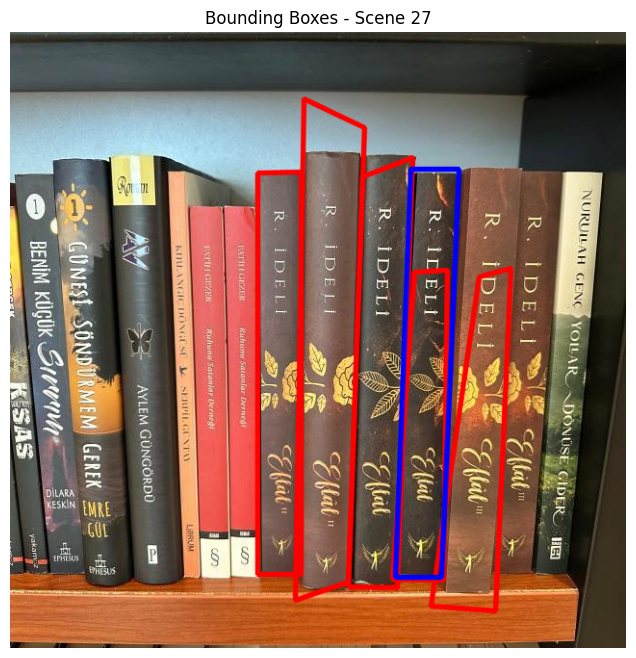

Book 2 - 5 instance(s) found:
  Instance 1 {top_left: (257, 146), top_right: (302, 145), bottom_left: (257, 563), bottom_right: (302, 563), area: 18745px}
  Instance 2 {top_left: (305, 69), top_right: (368, 99), bottom_left: (296, 590), bottom_right: (351, 571), area: 29513px}
  Instance 3 {top_left: (420, 249), top_right: (454, 247), bottom_left: (397, 568), bottom_right: (450, 569), area: 13975px}
  Instance 4 {top_left: (366, 150), top_right: (418, 130), bottom_left: (351, 576), bottom_right: (402, 577), area: 22446px}
  Instance 5 {top_left: (487, 254), top_right: (520, 245), bottom_left: (437, 596), bottom_right: (504, 601), area: 17347px}
Book 3 - 1 instance(s) found:
  Instance 1 {top_left: (416, 142), top_right: (466, 142), bottom_left: (400, 566), bottom_right: (448, 566), area: 20832px}

--- Scene 28 ---


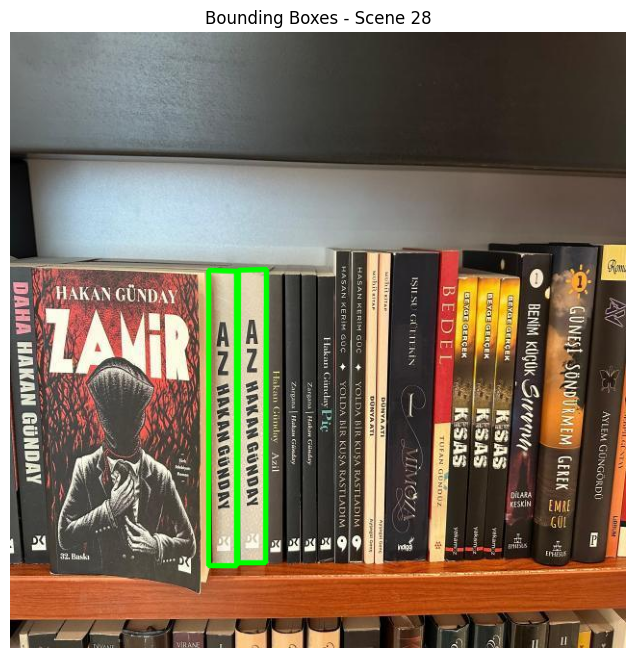

Book 1 - 2 instance(s) found:
  Instance 1 {top_left: (206, 247), top_right: (235, 248), bottom_left: (206, 554), bottom_right: (235, 554), area: 8779px}
  Instance 2 {top_left: (237, 247), top_right: (266, 246), bottom_left: (236, 551), bottom_right: (265, 551), area: 8820px}


In [ ]:
colors = [
    (255, 0, 0),   # blue
    (0, 255, 0),   # green
    (0, 0, 255)    # red
]

for scene_idx, (img_scene_gray, img_scene_color) in enumerate(zip(img_scenes_gray, img_scenes_color)):
    print(f"\n--- Scene {scene_idx} ---")
    scene_with_boxes = img_scene_color.copy()
    descriptions = []

    for model_idx, img_model in enumerate(img_models):
        color = colors[model_idx % len(colors)]
        detected_instances = detect_and_localize_with_mask(img_model, img_scene_gray, model_idx, color=color)

        if detected_instances:
            desc = f"Book {model_idx} - {len(detected_instances)} instance(s) found:"
            for i, inst in enumerate(detected_instances, 1):
                tl, tr, br, bl = inst['coords']
                area = inst['area']
                desc += f"\n  Instance {i} {{top_left: {tuple(map(int, tl))}, " \
                        f"top_right: {tuple(map(int, tr))}, " \
                        f"bottom_left: {tuple(map(int, bl))}, " \
                        f"bottom_right: {tuple(map(int, br))}, " \
                        f"area: {area}px}}"

                cv2.polylines(scene_with_boxes, [np.int32(inst['coords'])], True, color, 3, cv2.LINE_AA)

            descriptions.append(desc)

    plt.figure(figsize=(10, 8))
    plt.title(f"Bounding Boxes - Scene {scene_idx}")
    plt.imshow(cv2.cvtColor(scene_with_boxes, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    for desc in descriptions:
        print(desc)


The results we got in this case was really close to the 100% of accuracy, except for cases where rotation, translation or illumitation were ambiguous